## Turbulence code

Xin Wen, Mike Fitzsimmons

04.18.2022

This script runs all turbulence data analysis step by step.
All function are stored in turbulence.py. Must import turbulence.py before running the script. 

04.18.2022 
Added peak filters to identy 'birth' clouds from diffused clouds by cut off intensity from intensity histogram. 
The two types pf peaks are then clustered seperately.
Contains unfinished work.

05.10.2022 
Add net velocity vector in correlator function.
Quit diffused clouds/birth clouds idea.

09.06.2022
Fix errors


## Import Libraries

In [1]:
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import LogNorm
import matplotlib.colors as colors
from mpl_toolkits.mplot3d import Axes3D
from math import pi
import sys
import os
import spe2py as spe
import spe_loader as sl
import getopt
import scipy.io as sio
import scipy.optimize as opt
from scipy import ndimage, misc
from datetime import datetime
from datetime import timedelta 
from dateutil import parser
import photutils.detection
import copy
import ipympl
import gc # release memroy
from sklearn.cluster import MeanShift, estimate_bandwidth
from itertools import cycle
# For correlator
import itertools as it
from IPython.display import display, HTML
from scipy.stats import skew
from scipy.stats import kurtosis
import turbulence
import importlib
importlib.reload(turbulence)
import matplotlib.patches as patches
from matplotlib.patches import Rectangle
import time

%matplotlib inline
# %matplotlib notebook

display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

In [2]:
BackFile = 'input/Back_NORM_3_18_44_Script179 03_21_12 186-raw.spe' ####### Enter your background file name here after input/.
InputFile = 'input/NORM_3_18_44_Script225 02_12_16 167-raw.spe' ####### Enter the name of the file you want to exam here after input/.
OutputFile = InputFile[InputFile.find('Script'):InputFile.find('-raw')].replace(" ", "_")
DefaultDir = os.getcwd() + r'/'

SpeNet_stdev = 15 # This is the standard deviation calculated from frames of lasers on neutrons off
nsig = 3

## Get the data


In [3]:
## Read in spe file and remove background Extract SpeNet and timestamps into numpy arrays
# The function returns SpeNet, BackAvg, TimeStampArray, AbsoluteTimeArray
os.chdir(DefaultDir)
importlib.reload(turbulence)
SpeNet, background, BackAvg, TimeStampArray, total_frame_number, xdim, ydim = turbulence.read_spe(BackFile, InputFile)

/Users/xinwen/Desktop/Codes used in Thesis for Github/input/Back_NORM_3_18_44_Script179 03_21_12 186-raw.spe
XML Footer was not loaded prior to calling _get_wavelength or 
XML Footer does not contain Wavelength Mapping information
Successfully loaded 1 file(s) in a SpeFile object
Number of frames in background = 1500
Dimensions of a frame are 256 by 256
/Users/xinwen/Desktop/Codes used in Thesis for Github/input/NORM_3_18_44_Script225 02_12_16 167-raw.spe
XML Footer was not loaded prior to calling _get_wavelength or 
XML Footer does not contain Wavelength Mapping information
Successfully loaded 1 file(s) in a SpeFile object
Number of frames in raw data = 1500
Dimensions of a frame are 256 by 256
The absolute time of the start of the first frame = 2022-01-04T02:12:16.7436692-05:00
The average intensity of one pixel in one frame of background = 603.6680908203125
The average intensity of one pixel in one frame of raw data   = 616.8592815450032
The average intensity of one pixel in one fra

## Display image integrated over all slices

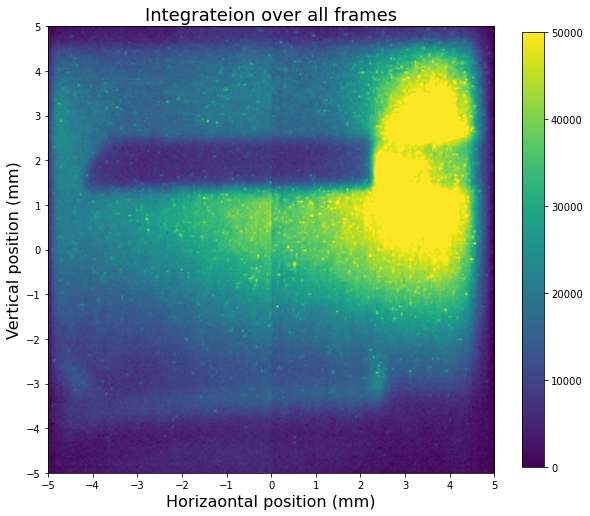

In [4]:
importlib.reload(turbulence)
Vmax = 50000 ###### You can change color bar scale here for best contrast
turbulence.display_frame_integral(SpeNet, beginning_frame = 0, ending_frame = len(SpeNet), Vmax = Vmax)

## Plot intensity vs time

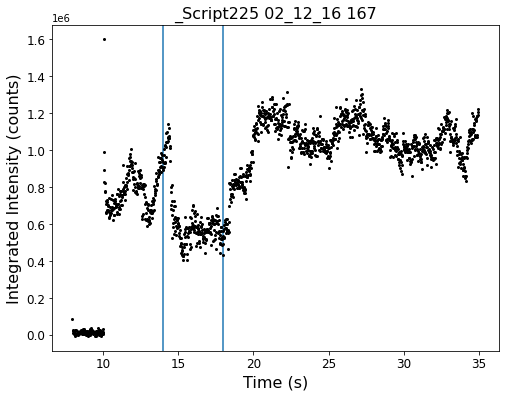

In [5]:
FrameIntegral = np.sum(SpeNet[:,:,:],axis=0)
TimeIntegral = np.sum(np.sum(SpeNet,axis=2),axis=1)
plt.figure(figsize = (8,6))
plt.xlabel('Time (s)', fontsize=16)
plt.ylabel('Integrated Intensity (counts)', fontsize=16)
plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.axvline(x=14)
plt.axvline(x=18)
plt.title(InputFile[-31:-8], fontsize = 16)
plt.plot(TimeStampArray[:,0]*1e-6,TimeIntegral,'ko',markersize=2)
plt.savefig('Intensity vs time.pdf')

## Superimpose all peaks

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

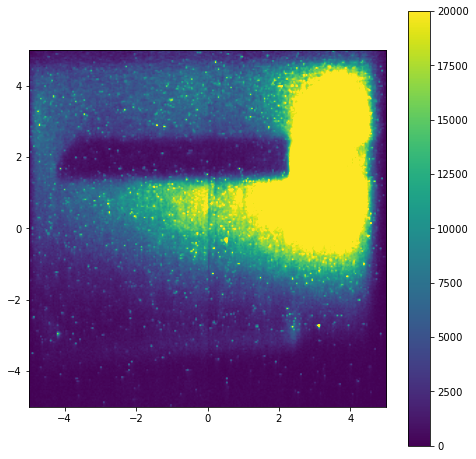

In [6]:
if 'SpeNet3sig' not in globals(): # Only need to run this once. If the background already exists, skip the step and go ahead to plot the background
    SpeNet3sig = SpeNet
    for i in range(SpeNet3sig.shape[0]):
        frame = SpeNet3sig[i]
        for x in range(frame.shape[0]):
            for y in range(frame.shape[1]):
                if frame[x][y] < nsig * 15:
                    frame[x][y] = 0
        SpeNet3sig[i]=frame
        print(i)
    print(frame)

# SpeNetnet = SpeNet
FrameIntegral = np.sum(SpeNet3sig[0:total_frame_number],axis=0)

fig, ax = plt.subplots(figsize = (8,8))
# plt.imshow(np.flip(FrameIntegral,axis=0), origin='lower',extent=([0,256,0,256]),interpolation='bilinear', cmap=cm.viridis, norm=colors.Normalize(vmin=0, vmax=20000))
plt.imshow(np.flip(FrameIntegral,axis=0), origin='lower',extent=([-5,5,-5,5]),interpolation='bilinear', cmap=cm.viridis, norm=colors.Normalize(vmin=0, vmax=20000))
plt.colorbar()
# plt.axhline(y = 192*10/256-5, color = 'r')
# plt.axhline(y = 164*10/256-5, color = 'r')
# plt.axvline(x = 23*10/256-5, color = 'r')
# plt.axvline(x = 184*10/256-5, color = 'r')
# plt.axvline(x = 242*10/256-5, color = 'r')
plt.savefig('Integrateion over all frames_%dsigma.jpg'%nsig, dpi=300)
# ax.add_patch(Rectangle((23*10/256-5, 164*10/256-5), 161*10/256,28*10/256, edgecolor = 'green',facecolor = 'red',alpha = 0.6, fill=True, lw = 1))

plt.show()

In [7]:
SpeNet = copy.deepcopy(SpeNet3sig)
print('Done')

Done


## Identify bad pixels and create a bad pixel mask

2022.08.24 Xin Wen

Back Mean Raw: 603.668
Back Stdev Raw: 25.477693


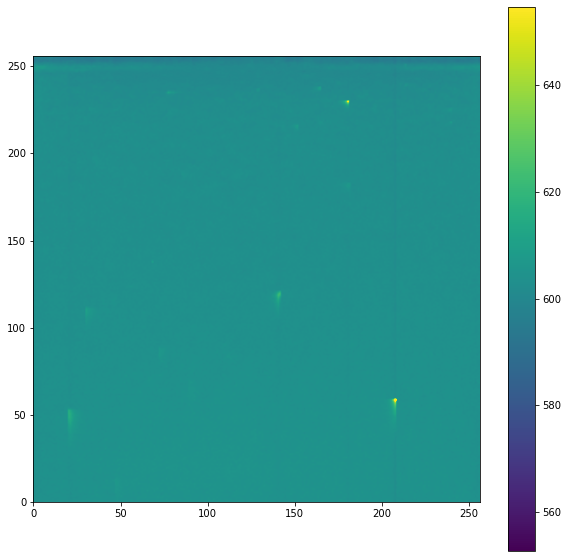

Back Mean Norm: 603.668
Back Stdev Norm: 1.631829
2 sigma threshold: 606.932
Back Mean Nsig: 254.675
Back Stdev Nsig: 22.660960


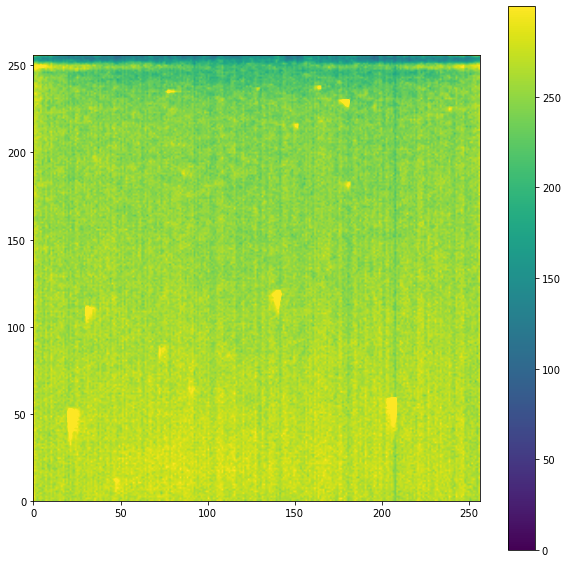

2 sigma threshold: 299.997



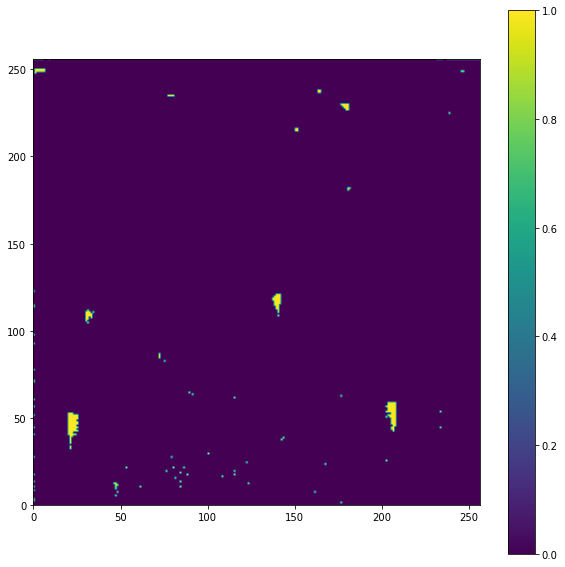

Number of bad pixels is 331
Time used: 31.746234893798828 seconds


In [8]:
start_time = time.time()
importlib.reload(turbulence)
Bsig = 2
bad_pixel_mask, bad_pixel_list, bad_pixel_number = turbulence.find_bad_pixel(InputFile, background, Bsig)
print("Time used: %s seconds" % (time.time() - start_time))

## Find peaks above threshold n x sigma above background

In [10]:
start_time = time.time()
importlib.reload(turbulence)
# nsig = 3
peaks_list, original_peaks, total_peaks_number = turbulence.find_peaks(nsig, SpeNet, InputFile, Box_size = 5)
print("Time: %s seconds" % (time.time() - start_time))

3 sigma threshold = 45
[[0.00000000e+00 1.31000000e+02 1.00000000e+00 5.65473633e+01]
 [0.00000000e+00 3.30000000e+01 4.00000000e+00 4.66013184e+01]
 [0.00000000e+00 7.80000000e+01 4.00000000e+00 4.50120239e+01]
 ...
 [1.49800000e+03 5.90000000e+01 2.49000000e+02 4.76300049e+01]
 [1.49800000e+03 7.80000000e+01 2.52000000e+02 4.65886841e+01]
 [1.49800000e+03 2.00000000e+02 2.53000000e+02 4.60446777e+01]]
Total number of original peaks: 1423006
Time: 13.81753396987915 seconds


## Remove peaks coincide with bad pixels and store the remaining peaks in clean_peaks list.

Number of peaks before culling: 1423006
Number of peaks after culling: 1416421


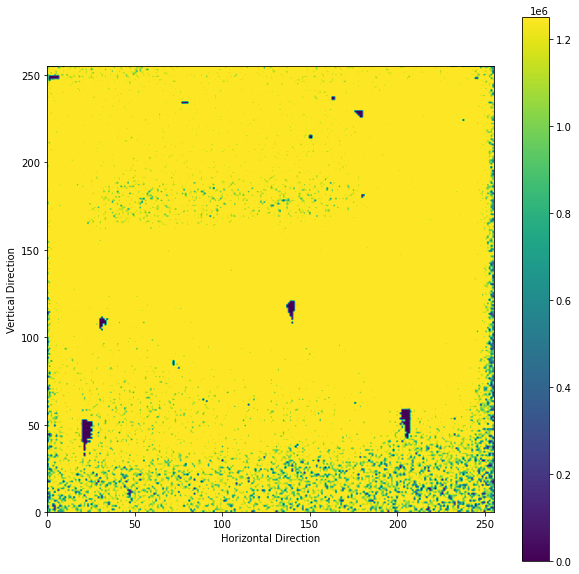

Time: 36.24997091293335 seconds


In [11]:
start_time = time.time()
importlib.reload(turbulence)
clean_peaks = turbulence.remove_bad_pixels(InputFile, original_peaks, bad_pixel_list, xdim, ydim, DoPlot = True, Vmax = 1250000)
print("Time: %s seconds" % (time.time() - start_time))

## Number of peaks in the object shadow vs frame number (Cylinder)

Frame number: 0	Number of All Peaks: 139	Number of Shadowed Peaks: 6
Frame number: 1	Number of All Peaks: 138	Number of Shadowed Peaks: 5
Frame number: 2	Number of All Peaks: 90	Number of Shadowed Peaks: 4
Frame number: 3	Number of All Peaks: 126	Number of Shadowed Peaks: 4
Frame number: 4	Number of All Peaks: 117	Number of Shadowed Peaks: 5
Frame number: 5	Number of All Peaks: 97	Number of Shadowed Peaks: 3
Frame number: 6	Number of All Peaks: 115	Number of Shadowed Peaks: 4
Frame number: 7	Number of All Peaks: 140	Number of Shadowed Peaks: 8
Frame number: 8	Number of All Peaks: 103	Number of Shadowed Peaks: 3
Frame number: 9	Number of All Peaks: 101	Number of Shadowed Peaks: 7
Frame number: 10	Number of All Peaks: 104	Number of Shadowed Peaks: 4
Frame number: 11	Number of All Peaks: 115	Number of Shadowed Peaks: 4
Frame number: 12	Number of All Peaks: 96	Number of Shadowed Peaks: 2
Frame number: 13	Number of All Peaks: 105	Number of Shadowed Peaks: 2
Frame number: 14	Number of All Pe

Frame number: 175	Number of All Peaks: 868	Number of Shadowed Peaks: 62
Frame number: 176	Number of All Peaks: 859	Number of Shadowed Peaks: 49
Frame number: 177	Number of All Peaks: 882	Number of Shadowed Peaks: 65
Frame number: 178	Number of All Peaks: 900	Number of Shadowed Peaks: 65
Frame number: 179	Number of All Peaks: 853	Number of Shadowed Peaks: 62
Frame number: 180	Number of All Peaks: 869	Number of Shadowed Peaks: 66
Frame number: 181	Number of All Peaks: 875	Number of Shadowed Peaks: 56
Frame number: 182	Number of All Peaks: 864	Number of Shadowed Peaks: 55
Frame number: 183	Number of All Peaks: 874	Number of Shadowed Peaks: 63
Frame number: 184	Number of All Peaks: 844	Number of Shadowed Peaks: 52
Frame number: 185	Number of All Peaks: 880	Number of Shadowed Peaks: 44
Frame number: 186	Number of All Peaks: 886	Number of Shadowed Peaks: 61
Frame number: 187	Number of All Peaks: 905	Number of Shadowed Peaks: 59
Frame number: 188	Number of All Peaks: 967	Number of Shadowed Pe

Frame number: 293	Number of All Peaks: 787	Number of Shadowed Peaks: 45
Frame number: 294	Number of All Peaks: 844	Number of Shadowed Peaks: 51
Frame number: 295	Number of All Peaks: 851	Number of Shadowed Peaks: 49
Frame number: 296	Number of All Peaks: 896	Number of Shadowed Peaks: 43
Frame number: 297	Number of All Peaks: 845	Number of Shadowed Peaks: 50
Frame number: 298	Number of All Peaks: 902	Number of Shadowed Peaks: 45
Frame number: 299	Number of All Peaks: 843	Number of Shadowed Peaks: 46
Frame number: 300	Number of All Peaks: 863	Number of Shadowed Peaks: 45
Frame number: 301	Number of All Peaks: 902	Number of Shadowed Peaks: 36
Frame number: 302	Number of All Peaks: 911	Number of Shadowed Peaks: 49
Frame number: 303	Number of All Peaks: 863	Number of Shadowed Peaks: 53
Frame number: 304	Number of All Peaks: 936	Number of Shadowed Peaks: 49
Frame number: 305	Number of All Peaks: 950	Number of Shadowed Peaks: 61
Frame number: 306	Number of All Peaks: 901	Number of Shadowed Pe

Frame number: 448	Number of All Peaks: 695	Number of Shadowed Peaks: 15
Frame number: 449	Number of All Peaks: 738	Number of Shadowed Peaks: 14
Frame number: 450	Number of All Peaks: 752	Number of Shadowed Peaks: 33
Frame number: 451	Number of All Peaks: 730	Number of Shadowed Peaks: 21
Frame number: 452	Number of All Peaks: 796	Number of Shadowed Peaks: 20
Frame number: 453	Number of All Peaks: 790	Number of Shadowed Peaks: 22
Frame number: 454	Number of All Peaks: 797	Number of Shadowed Peaks: 19
Frame number: 455	Number of All Peaks: 720	Number of Shadowed Peaks: 29
Frame number: 456	Number of All Peaks: 674	Number of Shadowed Peaks: 14
Frame number: 457	Number of All Peaks: 663	Number of Shadowed Peaks: 20
Frame number: 458	Number of All Peaks: 770	Number of Shadowed Peaks: 22
Frame number: 459	Number of All Peaks: 752	Number of Shadowed Peaks: 45
Frame number: 460	Number of All Peaks: 723	Number of Shadowed Peaks: 14
Frame number: 461	Number of All Peaks: 676	Number of Shadowed Pe

Frame number: 596	Number of All Peaks: 997	Number of Shadowed Peaks: 53
Frame number: 597	Number of All Peaks: 1034	Number of Shadowed Peaks: 52
Frame number: 598	Number of All Peaks: 1000	Number of Shadowed Peaks: 49
Frame number: 599	Number of All Peaks: 1002	Number of Shadowed Peaks: 55
Frame number: 600	Number of All Peaks: 944	Number of Shadowed Peaks: 39
Frame number: 601	Number of All Peaks: 1015	Number of Shadowed Peaks: 50
Frame number: 602	Number of All Peaks: 1037	Number of Shadowed Peaks: 43
Frame number: 603	Number of All Peaks: 964	Number of Shadowed Peaks: 45
Frame number: 604	Number of All Peaks: 1038	Number of Shadowed Peaks: 50
Frame number: 605	Number of All Peaks: 974	Number of Shadowed Peaks: 39
Frame number: 606	Number of All Peaks: 975	Number of Shadowed Peaks: 39
Frame number: 607	Number of All Peaks: 1019	Number of Shadowed Peaks: 46
Frame number: 608	Number of All Peaks: 962	Number of Shadowed Peaks: 48
Frame number: 609	Number of All Peaks: 1036	Number of Sha

Frame number: 718	Number of All Peaks: 1206	Number of Shadowed Peaks: 52
Frame number: 719	Number of All Peaks: 1146	Number of Shadowed Peaks: 53
Frame number: 720	Number of All Peaks: 1176	Number of Shadowed Peaks: 61
Frame number: 721	Number of All Peaks: 1111	Number of Shadowed Peaks: 56
Frame number: 722	Number of All Peaks: 1154	Number of Shadowed Peaks: 56
Frame number: 723	Number of All Peaks: 1167	Number of Shadowed Peaks: 63
Frame number: 724	Number of All Peaks: 1242	Number of Shadowed Peaks: 62
Frame number: 725	Number of All Peaks: 1146	Number of Shadowed Peaks: 58
Frame number: 726	Number of All Peaks: 1178	Number of Shadowed Peaks: 76
Frame number: 727	Number of All Peaks: 1193	Number of Shadowed Peaks: 59
Frame number: 728	Number of All Peaks: 1137	Number of Shadowed Peaks: 48
Frame number: 729	Number of All Peaks: 1210	Number of Shadowed Peaks: 56
Frame number: 730	Number of All Peaks: 1219	Number of Shadowed Peaks: 55
Frame number: 731	Number of All Peaks: 1174	Number 

Frame number: 856	Number of All Peaks: 1170	Number of Shadowed Peaks: 66
Frame number: 857	Number of All Peaks: 1203	Number of Shadowed Peaks: 61
Frame number: 858	Number of All Peaks: 1113	Number of Shadowed Peaks: 59
Frame number: 859	Number of All Peaks: 1200	Number of Shadowed Peaks: 61
Frame number: 860	Number of All Peaks: 1146	Number of Shadowed Peaks: 67
Frame number: 861	Number of All Peaks: 1164	Number of Shadowed Peaks: 68
Frame number: 862	Number of All Peaks: 1097	Number of Shadowed Peaks: 60
Frame number: 863	Number of All Peaks: 1125	Number of Shadowed Peaks: 56
Frame number: 864	Number of All Peaks: 1115	Number of Shadowed Peaks: 52
Frame number: 865	Number of All Peaks: 1158	Number of Shadowed Peaks: 68
Frame number: 866	Number of All Peaks: 1157	Number of Shadowed Peaks: 58
Frame number: 867	Number of All Peaks: 1156	Number of Shadowed Peaks: 67
Frame number: 868	Number of All Peaks: 1115	Number of Shadowed Peaks: 65
Frame number: 869	Number of All Peaks: 1086	Number 

Frame number: 996	Number of All Peaks: 1220	Number of Shadowed Peaks: 59
Frame number: 997	Number of All Peaks: 1146	Number of Shadowed Peaks: 52
Frame number: 998	Number of All Peaks: 1115	Number of Shadowed Peaks: 51
Frame number: 999	Number of All Peaks: 1178	Number of Shadowed Peaks: 54
Frame number: 1000	Number of All Peaks: 1147	Number of Shadowed Peaks: 58
Frame number: 1001	Number of All Peaks: 1171	Number of Shadowed Peaks: 55
Frame number: 1002	Number of All Peaks: 1182	Number of Shadowed Peaks: 58
Frame number: 1003	Number of All Peaks: 1128	Number of Shadowed Peaks: 67
Frame number: 1004	Number of All Peaks: 1221	Number of Shadowed Peaks: 62
Frame number: 1005	Number of All Peaks: 1203	Number of Shadowed Peaks: 68
Frame number: 1006	Number of All Peaks: 1188	Number of Shadowed Peaks: 54
Frame number: 1007	Number of All Peaks: 1216	Number of Shadowed Peaks: 69
Frame number: 1008	Number of All Peaks: 1106	Number of Shadowed Peaks: 52
Frame number: 1009	Number of All Peaks: 12

Frame number: 1134	Number of All Peaks: 1076	Number of Shadowed Peaks: 39
Frame number: 1135	Number of All Peaks: 1066	Number of Shadowed Peaks: 60
Frame number: 1136	Number of All Peaks: 1133	Number of Shadowed Peaks: 56
Frame number: 1137	Number of All Peaks: 1072	Number of Shadowed Peaks: 55
Frame number: 1138	Number of All Peaks: 1081	Number of Shadowed Peaks: 59
Frame number: 1139	Number of All Peaks: 1031	Number of Shadowed Peaks: 56
Frame number: 1140	Number of All Peaks: 1064	Number of Shadowed Peaks: 55
Frame number: 1141	Number of All Peaks: 1114	Number of Shadowed Peaks: 59
Frame number: 1142	Number of All Peaks: 1118	Number of Shadowed Peaks: 42
Frame number: 1143	Number of All Peaks: 1113	Number of Shadowed Peaks: 57
Frame number: 1144	Number of All Peaks: 1111	Number of Shadowed Peaks: 58
Frame number: 1145	Number of All Peaks: 1099	Number of Shadowed Peaks: 60
Frame number: 1146	Number of All Peaks: 1100	Number of Shadowed Peaks: 50
Frame number: 1147	Number of All Peaks

Frame number: 1293	Number of All Peaks: 996	Number of Shadowed Peaks: 66
Frame number: 1294	Number of All Peaks: 1003	Number of Shadowed Peaks: 48
Frame number: 1295	Number of All Peaks: 1031	Number of Shadowed Peaks: 51
Frame number: 1296	Number of All Peaks: 1020	Number of Shadowed Peaks: 67
Frame number: 1297	Number of All Peaks: 978	Number of Shadowed Peaks: 53
Frame number: 1298	Number of All Peaks: 1037	Number of Shadowed Peaks: 56
Frame number: 1299	Number of All Peaks: 1015	Number of Shadowed Peaks: 54
Frame number: 1300	Number of All Peaks: 1012	Number of Shadowed Peaks: 56
Frame number: 1301	Number of All Peaks: 995	Number of Shadowed Peaks: 48
Frame number: 1302	Number of All Peaks: 1050	Number of Shadowed Peaks: 53
Frame number: 1303	Number of All Peaks: 1028	Number of Shadowed Peaks: 65
Frame number: 1304	Number of All Peaks: 1004	Number of Shadowed Peaks: 48
Frame number: 1305	Number of All Peaks: 1040	Number of Shadowed Peaks: 51
Frame number: 1306	Number of All Peaks: 9

Frame number: 1438	Number of All Peaks: 1017	Number of Shadowed Peaks: 60
Frame number: 1439	Number of All Peaks: 1061	Number of Shadowed Peaks: 54
Frame number: 1440	Number of All Peaks: 988	Number of Shadowed Peaks: 56
Frame number: 1441	Number of All Peaks: 1003	Number of Shadowed Peaks: 55
Frame number: 1442	Number of All Peaks: 985	Number of Shadowed Peaks: 49
Frame number: 1443	Number of All Peaks: 1054	Number of Shadowed Peaks: 51
Frame number: 1444	Number of All Peaks: 994	Number of Shadowed Peaks: 63
Frame number: 1445	Number of All Peaks: 1054	Number of Shadowed Peaks: 72
Frame number: 1446	Number of All Peaks: 1037	Number of Shadowed Peaks: 60
Frame number: 1447	Number of All Peaks: 1045	Number of Shadowed Peaks: 62
Frame number: 1448	Number of All Peaks: 947	Number of Shadowed Peaks: 57
Frame number: 1449	Number of All Peaks: 984	Number of Shadowed Peaks: 58
Frame number: 1450	Number of All Peaks: 989	Number of Shadowed Peaks: 63
Frame number: 1451	Number of All Peaks: 1004

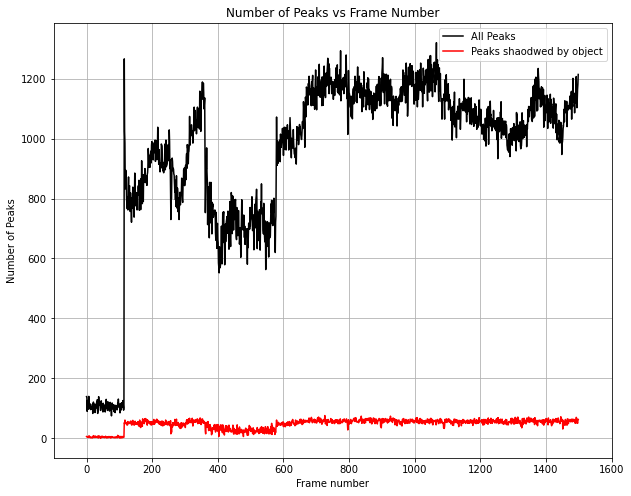

In [12]:
# Center of the cylinder object is at (117, 151) with radius of 26
false_peaks_log = open(OutputFile+'_overlap_peak_numbers.txt','w')
false_peaks_log.write('Frame#\tAll Peaks\tShaodwed Peaks\n')

clean_peaks_byframe = np.split(clean_peaks,np.flatnonzero(np.diff(clean_peaks[:,0]))+1) # split the original peaks by frame

all_peaks = np.zeros((2,len(clean_peaks_byframe)))
false_peaks = np.zeros((2,len(clean_peaks_byframe))) # Array that store the number of peaks fall into the cylinder shadow region
for frame in range(len(clean_peaks_byframe)):
    all_peaks[0,frame] = frame
    all_peaks[1,frame] = np.shape(clean_peaks_byframe[frame])[0]
    false_peaks[0,frame] = frame
    overlap = 0
    for peak in clean_peaks_byframe[frame]:
        distance_sqr = np.square(peak[1]-117)+np.square(peak[2]-(256-151))
        if distance_sqr <= 27*27:
            overlap += 1
    false_peaks[1,frame] = overlap
    print('Frame number: %d\tNumber of All Peaks: %d\tNumber of Shadowed Peaks: %d'%(frame,np.shape(clean_peaks_byframe[frame])[0], overlap))
    false_peaks_log.write('%d\t%d\t%d\n'%(frame, np.shape(clean_peaks_byframe[frame])[0], overlap))
    false_peaks_log.flush
    
print('Number of all peaks after culling: %d'%np.sum(all_peaks[1,:]))  
print('Number of peaks in object shadow: %d'%np.sum(false_peaks[1,:]))
print('Number of peaks left: %d'%(np.sum(all_peaks[1,:])-np.sum(false_peaks[1,:])))

# overlap = np.loadtxt(OutputFile+'_overlap_peaks.txt', skiprows = 1)
# print(overlap)
plt.figure(figsize = (10,8))
print(np.mean(false_peaks[1,:]))
plt.plot(all_peaks[0,:], all_peaks[1,:],'k',label='All Peaks')
plt.plot(false_peaks[0,:], false_peaks[1,:],'r',label='Peaks shaodwed by object')
plt.legend()
plt.xlim((-100,1600))
plt.xlabel('Frame number')
plt.ylabel('Number of Peaks')
plt.grid('on')
plt.title('Number of Peaks vs Frame Number')
plt.savefig('Number of peaks per frame.pdf')
plt.show()

## Remove peaks in the object region (Cylinder)

Total number of peaks after culling: 1416421
Number of peaks not shadowed by object: 1345135
Number of peaks removed: 71286


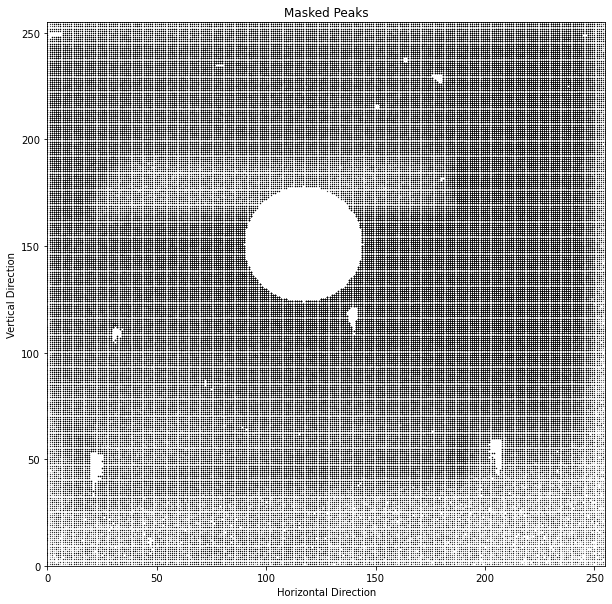

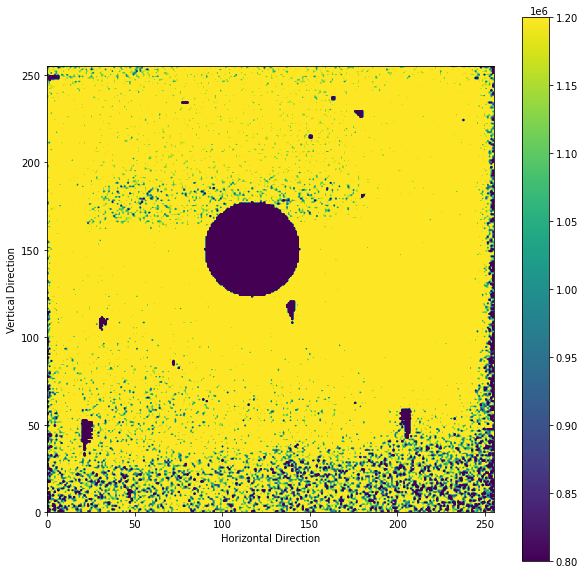

In [14]:
## Remove peaks in the shadow region
print('Total number of peaks after culling: %d' %clean_peaks.shape[0])
cleaner_peaks = copy.deepcopy(clean_peaks)
cleaner_peaks = np.delete(cleaner_peaks, np.where(np.square(cleaner_peaks[:,1]-117)+ np.square(cleaner_peaks[:,2]-(256-151))<= 27*27), axis=0)
print('Number of peaks not shadowed by object: %d' %cleaner_peaks.shape[0])
print('Number of peaks removed: %d'%(clean_peaks.shape[0]-cleaner_peaks.shape[0]))
np.savetxt(OutputFile+'_cleaner_peaks.txt',cleaner_peaks, fmt = '%d\t%d\t%d\t%.3f',  delimiter='\t', header='Frame\tx\ty\tIntensity', comments ='', encoding=None)

plt.figure(figsize = (10,10))
plt.scatter(cleaner_peaks[:,1],256-cleaner_peaks[:,2],s=0.01,color = 'k')
plt.xlim((0,255))
plt.ylim((0,255))
plt.xlabel('Horizontal Direction')
plt.ylabel('Vertical Direction')
plt.title('Masked Peaks')
plt.savefig('Masked Peaks1.jpg',dpi = 300)
plt.show()



# Plot the remaining peaks
x = cleaner_peaks[:,1]
y = cleaner_peaks[:,2]

image = np.zeros((xdim, ydim))
images = np.zeros((xdim, ydim))
for i in range(len(cleaner_peaks)):
    image[int(y[i]), int(x[i])] = 1
    images += image

plt.figure(figsize = (10,10))
plt.imshow(np.flip(images,axis = 0), origin='lower',extent=([0,255,0,255]),interpolation='bilinear', cmap=cm.viridis, vmin = 800000, vmax = 1200000)
plt.xlabel('Horizontal Direction')
plt.ylabel('Vertical Direction')
plt.colorbar()
plt.savefig('Masked Peaks2.jpg', dpi = 300)
plt.show()

## Number of peaks in the object shadow vs frame number (Flat plate)

Frame number: 0	Number of All Peaks: 143	Number of Shadowed Peaks: 11
Frame number: 1	Number of All Peaks: 109	Number of Shadowed Peaks: 4
Frame number: 2	Number of All Peaks: 117	Number of Shadowed Peaks: 6
Frame number: 3	Number of All Peaks: 105	Number of Shadowed Peaks: 4
Frame number: 4	Number of All Peaks: 113	Number of Shadowed Peaks: 10
Frame number: 5	Number of All Peaks: 109	Number of Shadowed Peaks: 4
Frame number: 6	Number of All Peaks: 116	Number of Shadowed Peaks: 10
Frame number: 7	Number of All Peaks: 140	Number of Shadowed Peaks: 8
Frame number: 8	Number of All Peaks: 109	Number of Shadowed Peaks: 11
Frame number: 9	Number of All Peaks: 111	Number of Shadowed Peaks: 4
Frame number: 10	Number of All Peaks: 117	Number of Shadowed Peaks: 10
Frame number: 11	Number of All Peaks: 114	Number of Shadowed Peaks: 7
Frame number: 12	Number of All Peaks: 117	Number of Shadowed Peaks: 7
Frame number: 13	Number of All Peaks: 93	Number of Shadowed Peaks: 4
Frame number: 14	Number of

Frame number: 479	Number of All Peaks: 613	Number of Shadowed Peaks: 21
Frame number: 480	Number of All Peaks: 632	Number of Shadowed Peaks: 24
Frame number: 481	Number of All Peaks: 693	Number of Shadowed Peaks: 31
Frame number: 482	Number of All Peaks: 667	Number of Shadowed Peaks: 25
Frame number: 483	Number of All Peaks: 619	Number of Shadowed Peaks: 28
Frame number: 484	Number of All Peaks: 652	Number of Shadowed Peaks: 27
Frame number: 485	Number of All Peaks: 655	Number of Shadowed Peaks: 32
Frame number: 486	Number of All Peaks: 662	Number of Shadowed Peaks: 28
Frame number: 487	Number of All Peaks: 706	Number of Shadowed Peaks: 39
Frame number: 488	Number of All Peaks: 638	Number of Shadowed Peaks: 33
Frame number: 489	Number of All Peaks: 725	Number of Shadowed Peaks: 32
Frame number: 490	Number of All Peaks: 712	Number of Shadowed Peaks: 31
Frame number: 491	Number of All Peaks: 701	Number of Shadowed Peaks: 32
Frame number: 492	Number of All Peaks: 682	Number of Shadowed Pe

Frame number: 818	Number of All Peaks: 1024	Number of Shadowed Peaks: 57
Frame number: 819	Number of All Peaks: 1061	Number of Shadowed Peaks: 69
Frame number: 820	Number of All Peaks: 1077	Number of Shadowed Peaks: 76
Frame number: 821	Number of All Peaks: 1044	Number of Shadowed Peaks: 49
Frame number: 822	Number of All Peaks: 1069	Number of Shadowed Peaks: 68
Frame number: 823	Number of All Peaks: 1063	Number of Shadowed Peaks: 41
Frame number: 824	Number of All Peaks: 1029	Number of Shadowed Peaks: 61
Frame number: 825	Number of All Peaks: 994	Number of Shadowed Peaks: 47
Frame number: 826	Number of All Peaks: 991	Number of Shadowed Peaks: 57
Frame number: 827	Number of All Peaks: 1012	Number of Shadowed Peaks: 63
Frame number: 828	Number of All Peaks: 1020	Number of Shadowed Peaks: 58
Frame number: 829	Number of All Peaks: 942	Number of Shadowed Peaks: 64
Frame number: 830	Number of All Peaks: 992	Number of Shadowed Peaks: 57
Frame number: 831	Number of All Peaks: 1040	Number of S

Frame number: 1086	Number of All Peaks: 987	Number of Shadowed Peaks: 58
Frame number: 1087	Number of All Peaks: 986	Number of Shadowed Peaks: 55
Frame number: 1088	Number of All Peaks: 994	Number of Shadowed Peaks: 42
Frame number: 1089	Number of All Peaks: 1053	Number of Shadowed Peaks: 58
Frame number: 1090	Number of All Peaks: 1038	Number of Shadowed Peaks: 70
Frame number: 1091	Number of All Peaks: 1021	Number of Shadowed Peaks: 73
Frame number: 1092	Number of All Peaks: 1018	Number of Shadowed Peaks: 61
Frame number: 1093	Number of All Peaks: 1007	Number of Shadowed Peaks: 57
Frame number: 1094	Number of All Peaks: 1017	Number of Shadowed Peaks: 57
Frame number: 1095	Number of All Peaks: 1018	Number of Shadowed Peaks: 62
Frame number: 1096	Number of All Peaks: 1019	Number of Shadowed Peaks: 66
Frame number: 1097	Number of All Peaks: 987	Number of Shadowed Peaks: 64
Frame number: 1098	Number of All Peaks: 1051	Number of Shadowed Peaks: 54
Frame number: 1099	Number of All Peaks: 10

Frame number: 1407	Number of All Peaks: 881	Number of Shadowed Peaks: 69
Frame number: 1408	Number of All Peaks: 967	Number of Shadowed Peaks: 70
Frame number: 1409	Number of All Peaks: 853	Number of Shadowed Peaks: 54
Frame number: 1410	Number of All Peaks: 903	Number of Shadowed Peaks: 77
Frame number: 1411	Number of All Peaks: 873	Number of Shadowed Peaks: 64
Frame number: 1412	Number of All Peaks: 902	Number of Shadowed Peaks: 75
Frame number: 1413	Number of All Peaks: 963	Number of Shadowed Peaks: 78
Frame number: 1414	Number of All Peaks: 914	Number of Shadowed Peaks: 93
Frame number: 1415	Number of All Peaks: 898	Number of Shadowed Peaks: 77
Frame number: 1416	Number of All Peaks: 829	Number of Shadowed Peaks: 66
Frame number: 1417	Number of All Peaks: 894	Number of Shadowed Peaks: 85
Frame number: 1418	Number of All Peaks: 883	Number of Shadowed Peaks: 74
Frame number: 1419	Number of All Peaks: 913	Number of Shadowed Peaks: 88
Frame number: 1420	Number of All Peaks: 882	Number 

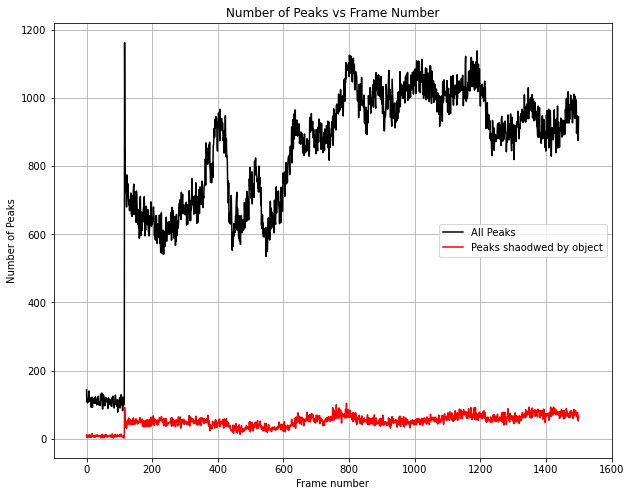

In [17]:
# Center of the cylinder object is at (117, 151) with radius of 26
false_peaks_log = open(OutputFile+'_overlap_peak_numbers.txt','w')
false_peaks_log.write('Frame#\tAll Peaks\tShaodwed Peaks\n')

clean_peaks_byframe = np.split(clean_peaks,np.flatnonzero(np.diff(clean_peaks[:,0]))+1) # split the original peaks by frame

all_peaks = np.zeros((2,len(clean_peaks_byframe)))
false_peaks = np.zeros((2,len(clean_peaks_byframe))) # Array that store the number of peaks fall into the cylinder shadow region
for frame in range(len(clean_peaks_byframe)):
    all_peaks[0,frame] = frame
    all_peaks[1,frame] = np.shape(clean_peaks_byframe[frame])[0]
    false_peaks[0,frame] = frame
    overlap = 0
    for peak in clean_peaks_byframe[frame]:
        if (peak[1]<184 and peak[1]>23) and peak[2]<192 and peak[2]>164:
            overlap += 1
    false_peaks[1,frame] = overlap
    print('Frame number: %d\tNumber of All Peaks: %d\tNumber of Shadowed Peaks: %d'%(frame,np.shape(clean_peaks_byframe[frame])[0], overlap))
    false_peaks_log.write('%d\t%d\t%d\n'%(frame, np.shape(clean_peaks_byframe[frame])[0], overlap))
    false_peaks_log.flush
    
print('Number of all peaks after culling: %d'%np.sum(all_peaks[1,:]))  
print('Number of peaks in object shadow: %d'%np.sum(false_peaks[1,:]))
print('Number of peaks left: %d'%(np.sum(all_peaks[1,:])-np.sum(false_peaks[1,:])))

# overlap = np.loadtxt(OutputFile+'_overlap_peaks.txt', skiprows = 1)
# print(overlap)
plt.figure(figsize = (10,8))
print(np.mean(false_peaks[1,:]))
plt.plot(all_peaks[0,:], all_peaks[1,:],'k',label='All Peaks')
plt.plot(false_peaks[0,:], false_peaks[1,:],'r',label='Peaks shaodwed by object')
plt.legend()
plt.xlim((-100,1600))
plt.xlabel('Frame number')
plt.ylabel('Number of Peaks')
plt.grid('on')
plt.title('Number of Peaks vs Frame Number')
plt.savefig('Number of peaks per frame.pdf')
plt.show()

## Remove peaks in the object region (Flat plate)

Total number of peaks after culling: 1215422
Number of peaks not shadowed by object: 1123604
Number of peaks removed: 91818


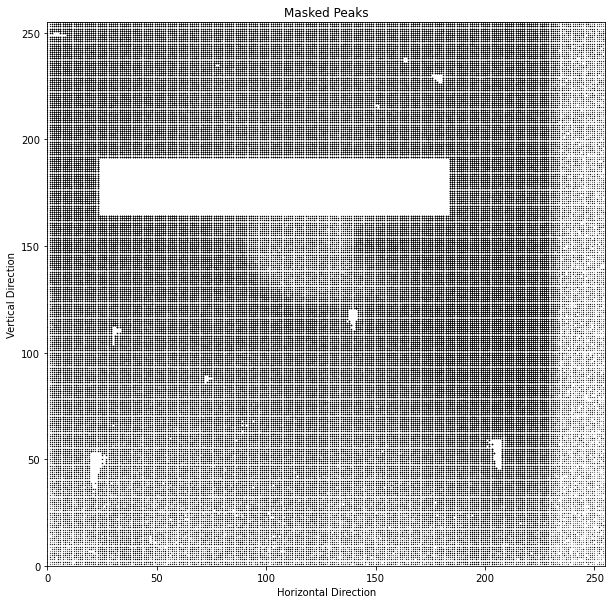

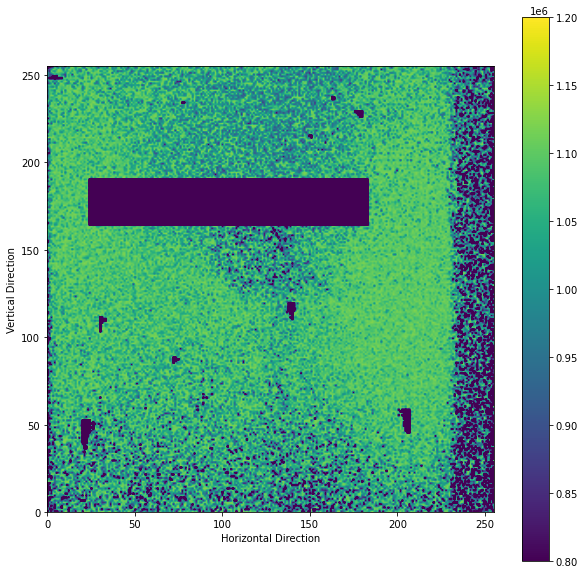

In [20]:
## Remove peaks in the shadow region
print('Total number of peaks after culling: %d' %clean_peaks.shape[0])
cleaner_peaks = copy.deepcopy(clean_peaks)
# cleaner_peaks = np.delete(cleaner_peaks, np.where((23 < cleaner_peaks[:,1]) & (cleaner_peaks[:,1] < 184)), axis=0)
cleaner_peaks = np.delete(cleaner_peaks, np.where(((23 < cleaner_peaks[:,1]) & (cleaner_peaks[:,1] < 184)) & ((164 < 256-cleaner_peaks[:,2]) & (256-cleaner_peaks[:,2] < 192))), axis=0)
print('Number of peaks not shadowed by object: %d' %cleaner_peaks.shape[0])
print('Number of peaks removed: %d'%(clean_peaks.shape[0]-cleaner_peaks.shape[0]))
np.savetxt(OutputFile+'_cleaner_peaks.txt',cleaner_peaks, fmt = '%d\t%d\t%d\t%.3f',  delimiter='\t', header='Frame\tx\ty\tIntensity', comments ='', encoding=None)

plt.figure(figsize = (10,10))
plt.scatter(cleaner_peaks[:,1],256-cleaner_peaks[:,2],s=0.01,color = 'k')
plt.xlim((0,255))
plt.ylim((0,255))
plt.xlabel('Horizontal Direction')
plt.ylabel('Vertical Direction')
plt.title('Masked Peaks')
plt.savefig('Masked Peaks1.jpg',dpi = 300)
plt.show()



# Plot the remaining peaks
x = cleaner_peaks[:,1]
y = cleaner_peaks[:,2]

image = np.zeros((xdim, ydim))
images = np.zeros((xdim, ydim))
for i in range(len(cleaner_peaks)):
    image[int(y[i]), int(x[i])] = 1
    images += image

plt.figure(figsize = (10,10))
plt.imshow(np.flip(images,axis = 0), origin='lower',extent=([0,255,0,255]),interpolation='bilinear', cmap=cm.viridis, vmin = 800000, vmax = 1200000)
plt.xlabel('Horizontal Direction')
plt.ylabel('Vertical Direction')
plt.colorbar()
plt.savefig('Masked Peaks2.jpg', dpi = 300)
plt.show()

## Make Integrated movies (Movies)
By running this step, a integrated movie will be created and store in '/integrated_movie_frams' subdirectory. Each frame in this movie is integrated over 'TimeWindow' seconds.

Created Directory :  /Users/xinwen/Desktop/3rd paper/Codes//integrated_movie_frames
0 53 7.995245 34.977405 0.5


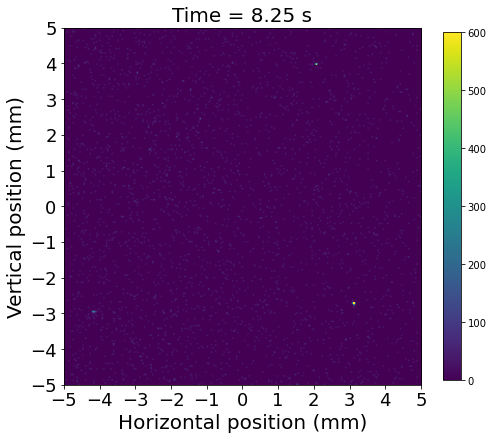

1 53 7.995245 34.977405 0.5


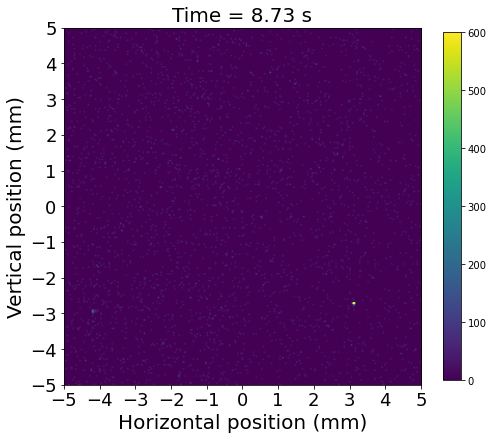

2 53 7.995245 34.977405 0.5


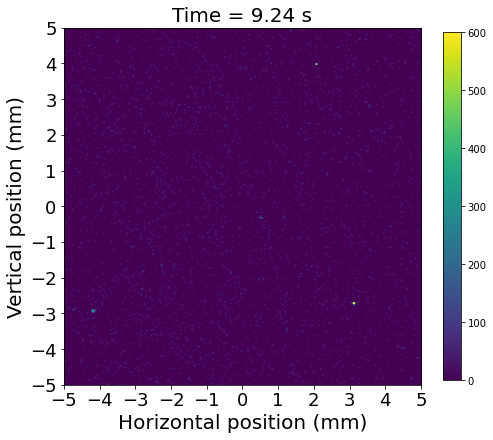

3 53 7.995245 34.977405 0.5


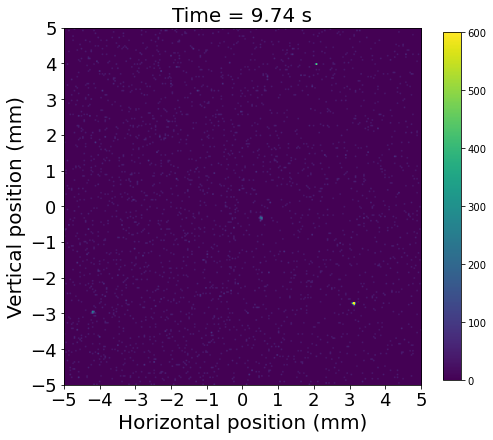

4 53 7.995245 34.977405 0.5


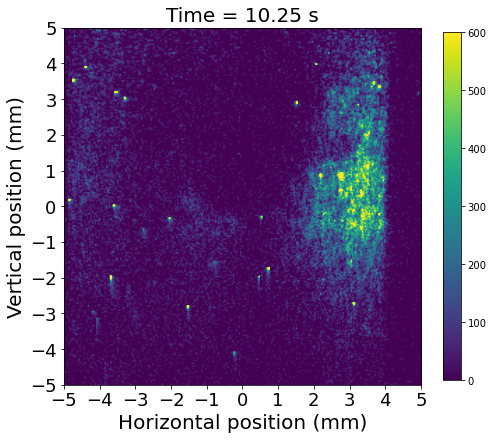

5 53 7.995245 34.977405 0.5


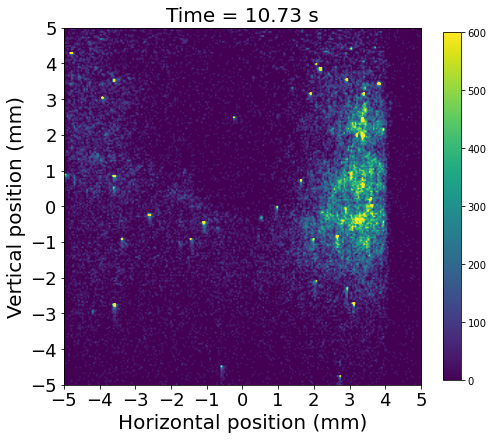

6 53 7.995245 34.977405 0.5


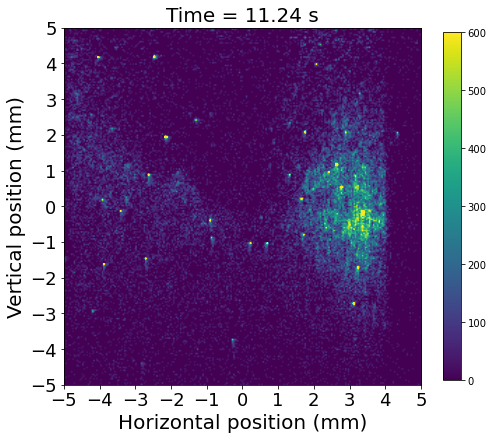

7 53 7.995245 34.977405 0.5


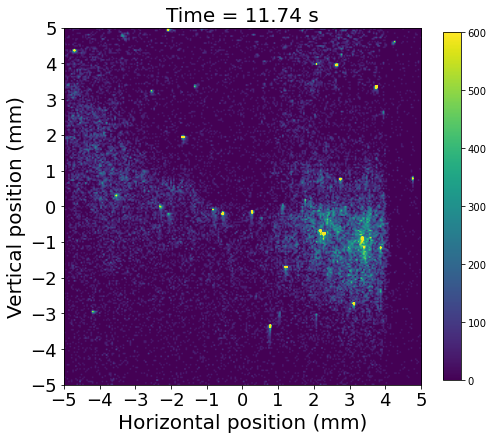

8 53 7.995245 34.977405 0.5


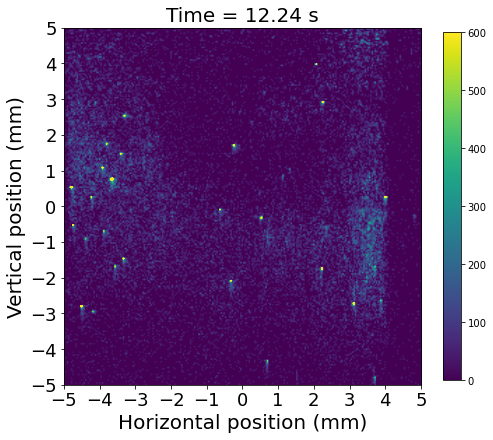

9 53 7.995245 34.977405 0.5


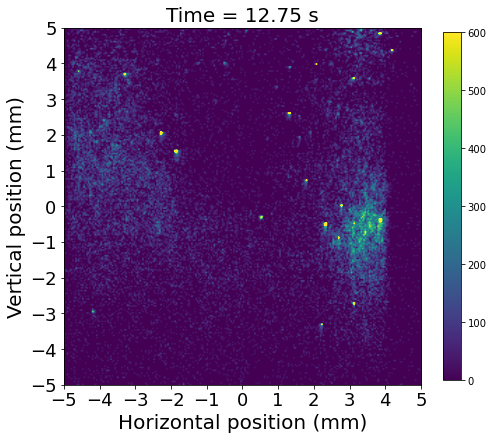

10 53 7.995245 34.977405 0.5


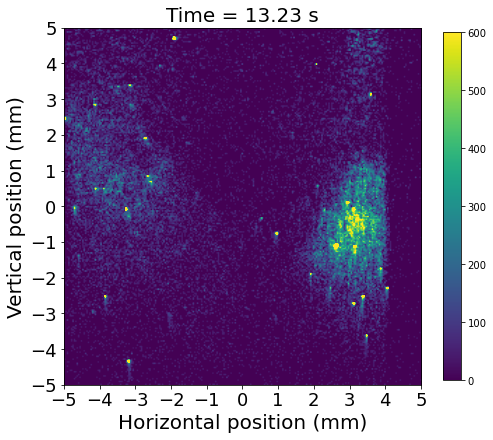

11 53 7.995245 34.977405 0.5


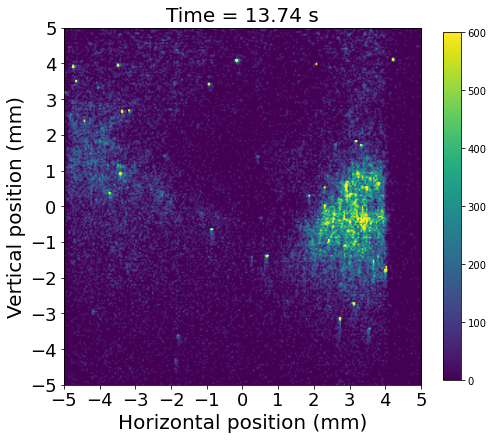

12 53 7.995245 34.977405 0.5


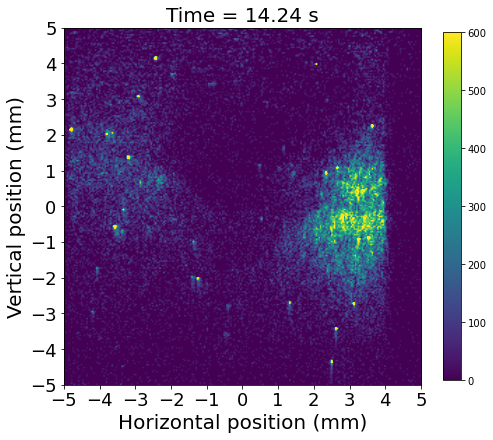

13 53 7.995245 34.977405 0.5


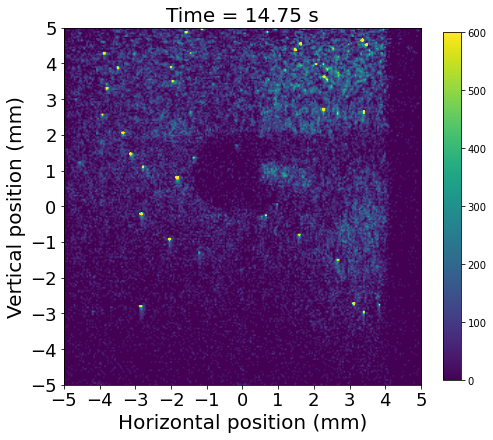

14 53 7.995245 34.977405 0.5


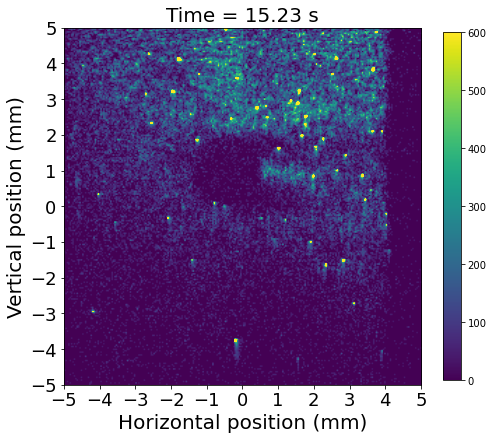

15 53 7.995245 34.977405 0.5


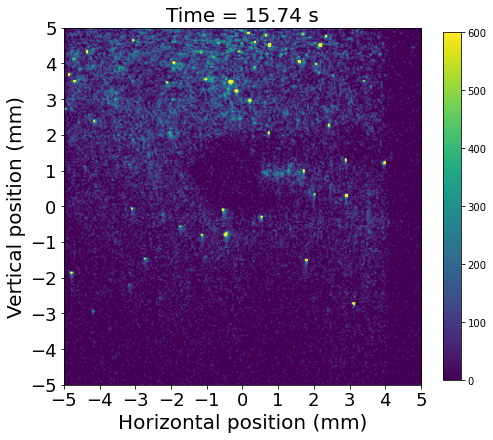

16 53 7.995245 34.977405 0.5


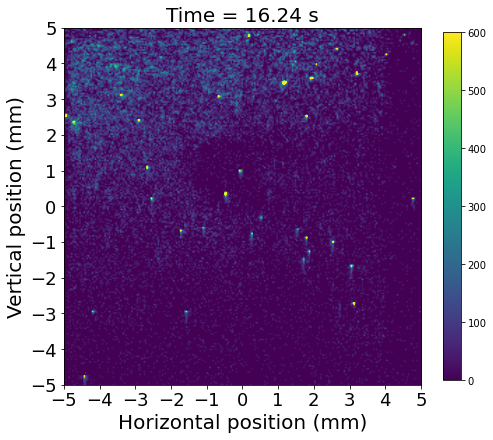

17 53 7.995245 34.977405 0.5


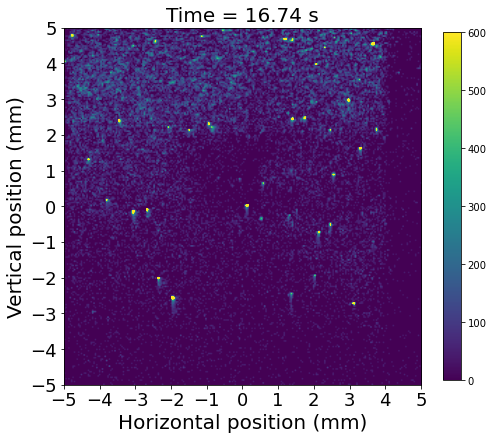

18 53 7.995245 34.977405 0.5


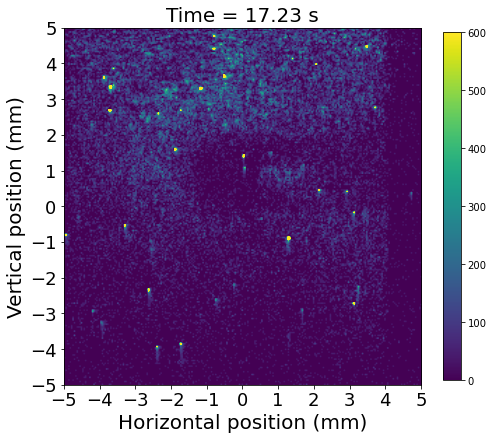

19 53 7.995245 34.977405 0.5


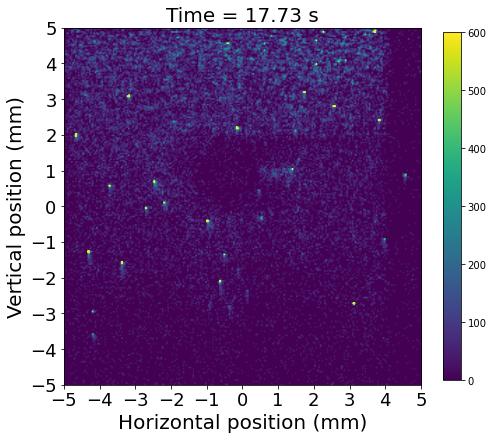

20 53 7.995245 34.977405 0.5


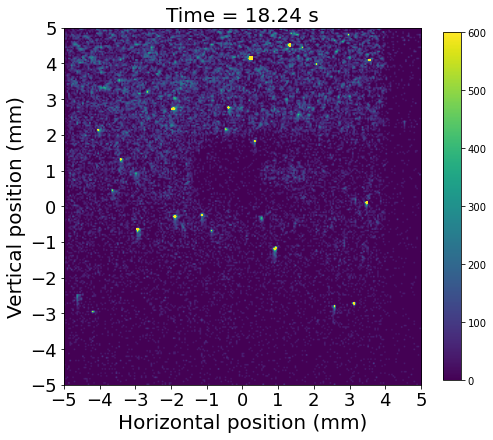

21 53 7.995245 34.977405 0.5


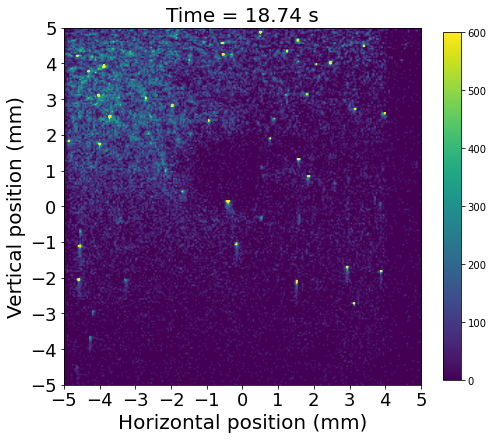

22 53 7.995245 34.977405 0.5


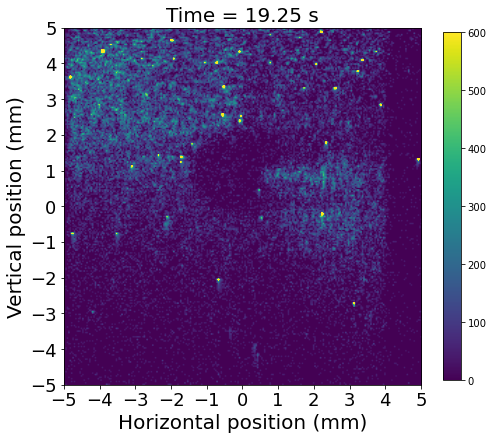

23 53 7.995245 34.977405 0.5


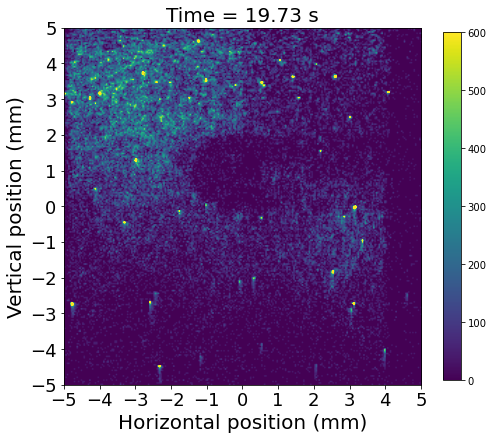

24 53 7.995245 34.977405 0.5


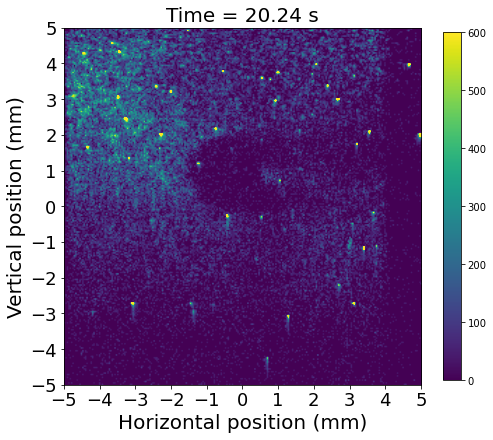

25 53 7.995245 34.977405 0.5


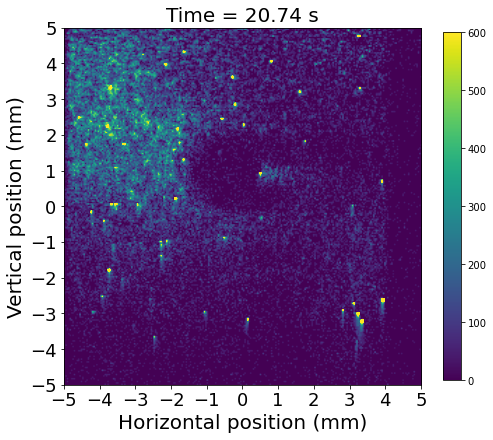

26 53 7.995245 34.977405 0.5


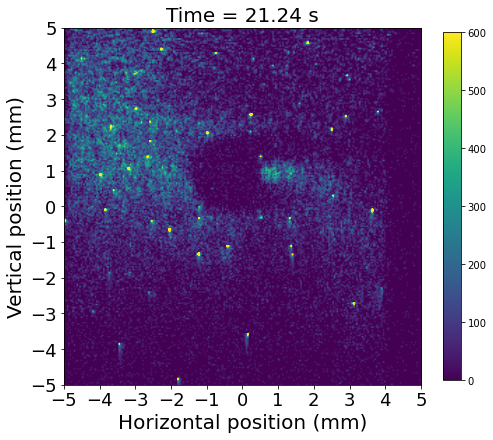

27 53 7.995245 34.977405 0.5


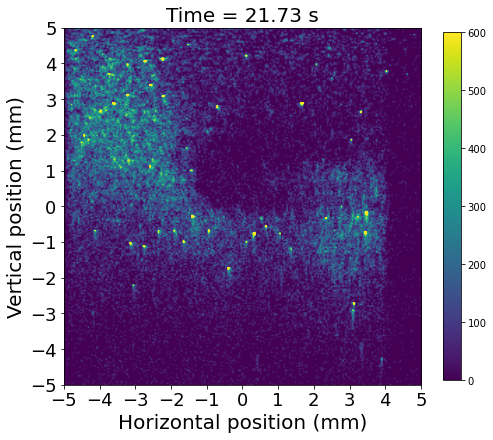

28 53 7.995245 34.977405 0.5


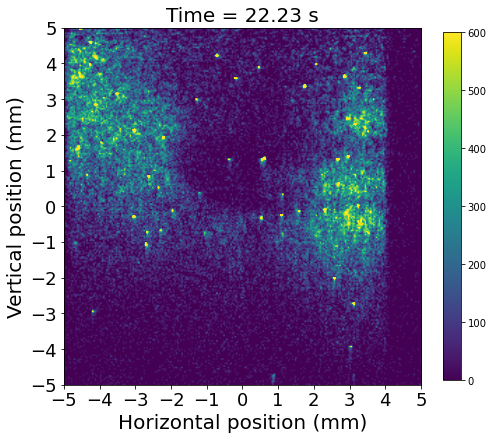

29 53 7.995245 34.977405 0.5


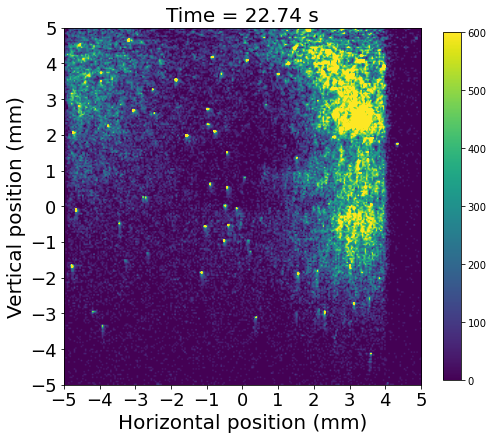

30 53 7.995245 34.977405 0.5


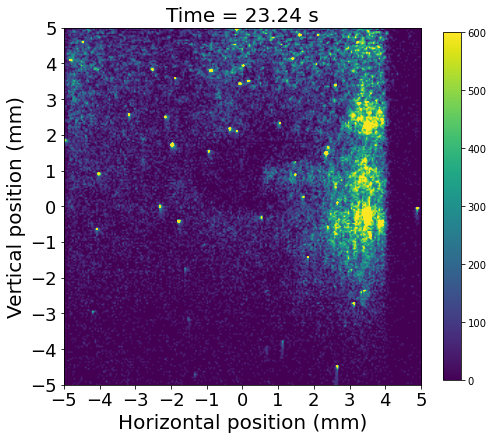

31 53 7.995245 34.977405 0.5


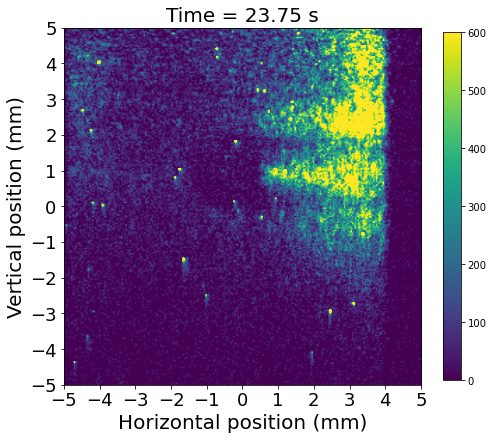

32 53 7.995245 34.977405 0.5


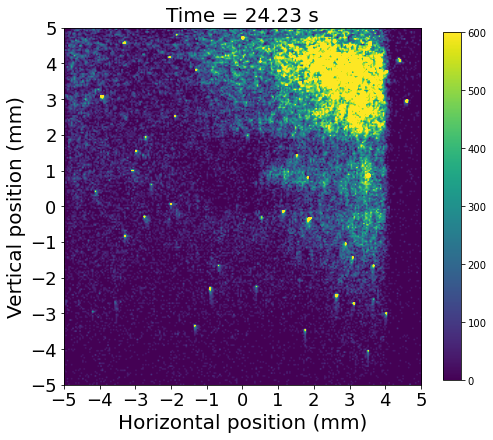

33 53 7.995245 34.977405 0.5


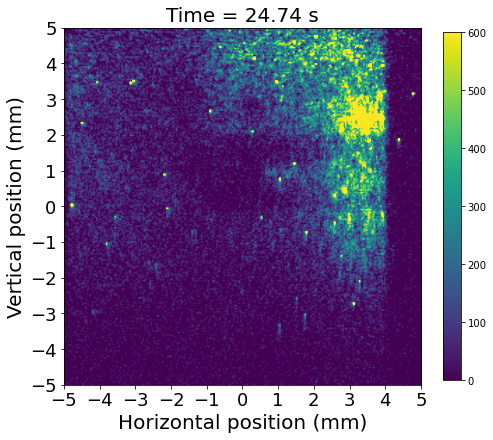

34 53 7.995245 34.977405 0.5


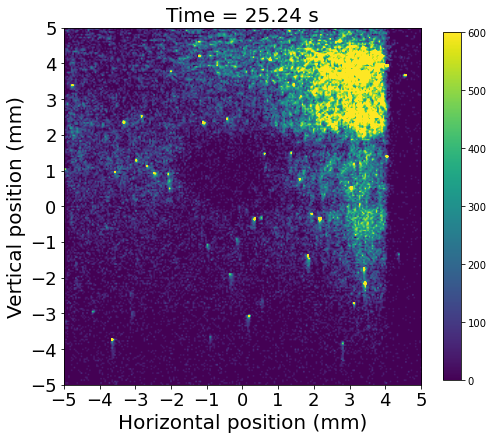

35 53 7.995245 34.977405 0.5


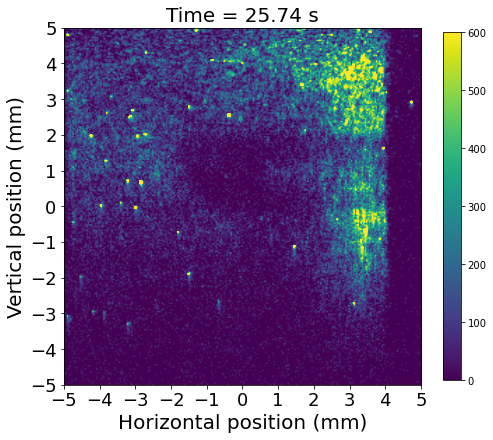

36 53 7.995245 34.977405 0.5


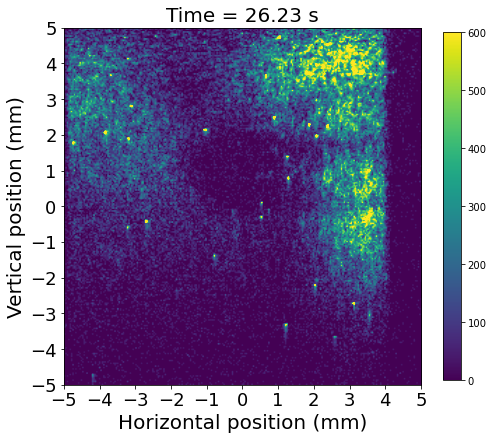

37 53 7.995245 34.977405 0.5


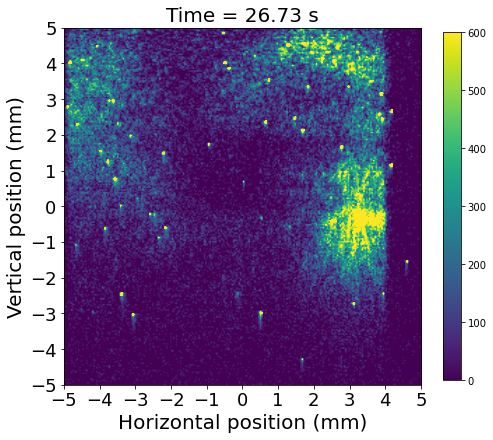

38 53 7.995245 34.977405 0.5


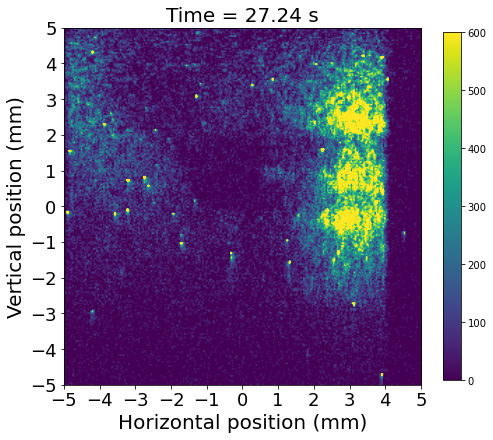

39 53 7.995245 34.977405 0.5


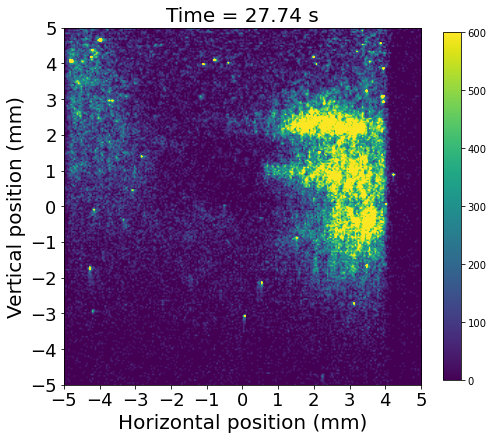

40 53 7.995245 34.977405 0.5


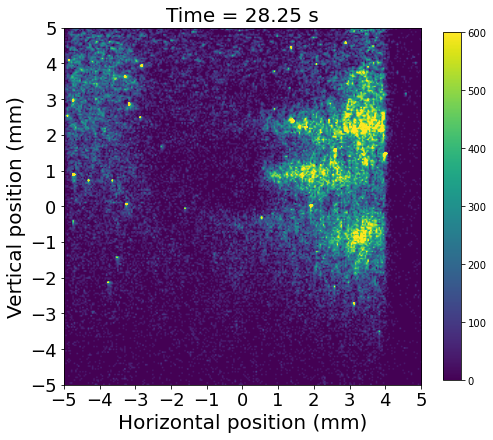

41 53 7.995245 34.977405 0.5


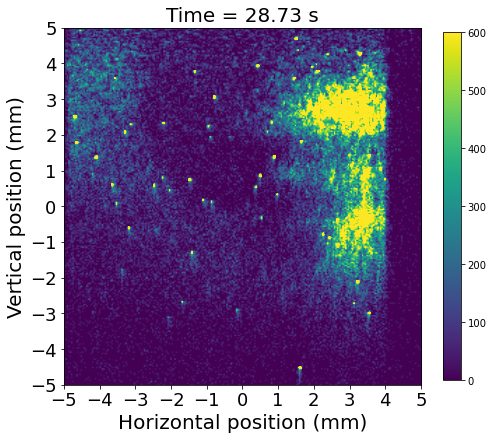

42 53 7.995245 34.977405 0.5


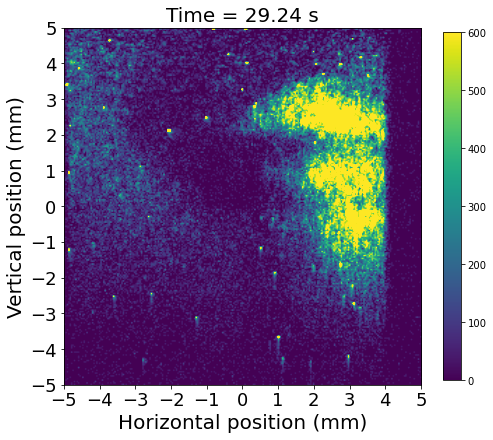

43 53 7.995245 34.977405 0.5


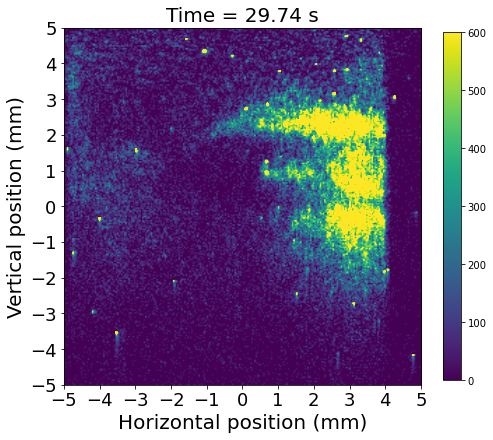

44 53 7.995245 34.977405 0.5


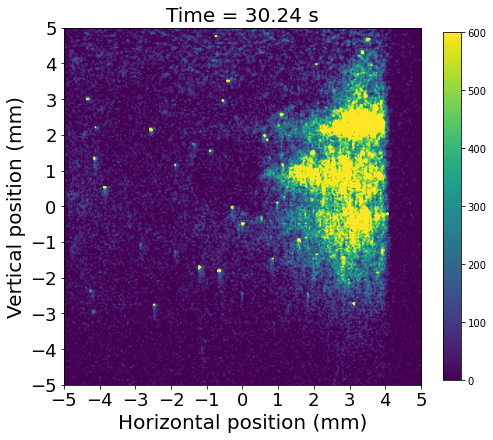

45 53 7.995245 34.977405 0.5


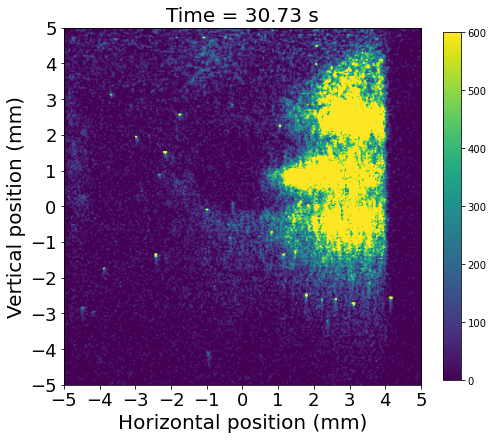

46 53 7.995245 34.977405 0.5


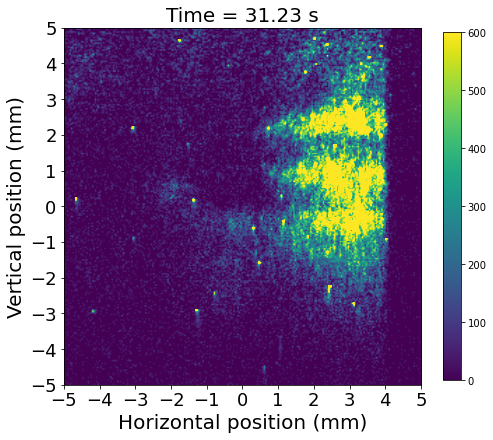

47 53 7.995245 34.977405 0.5


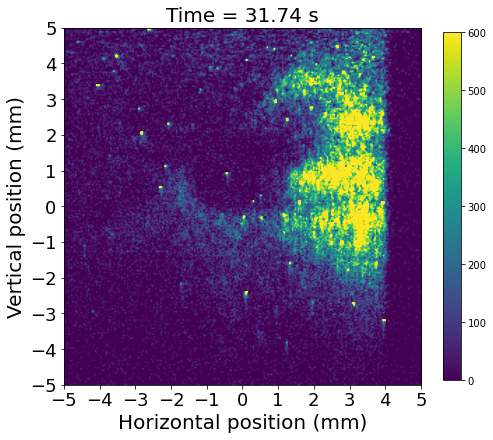

48 53 7.995245 34.977405 0.5


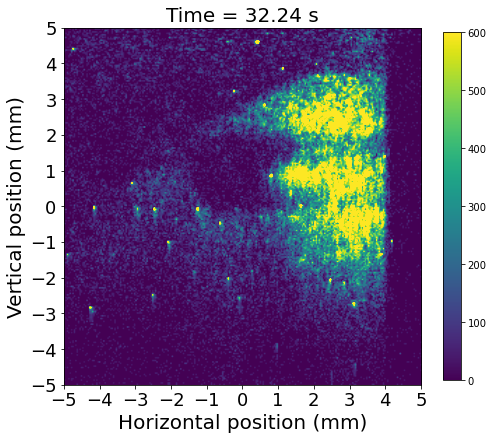

49 53 7.995245 34.977405 0.5


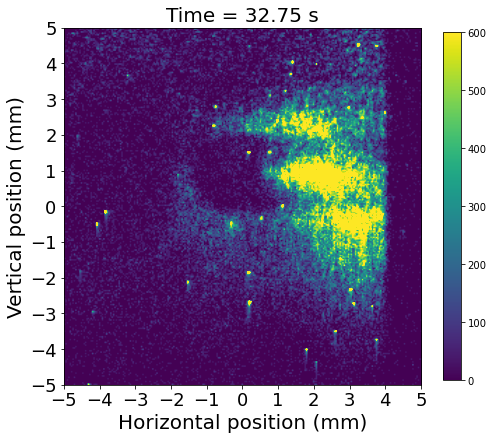

50 53 7.995245 34.977405 0.5


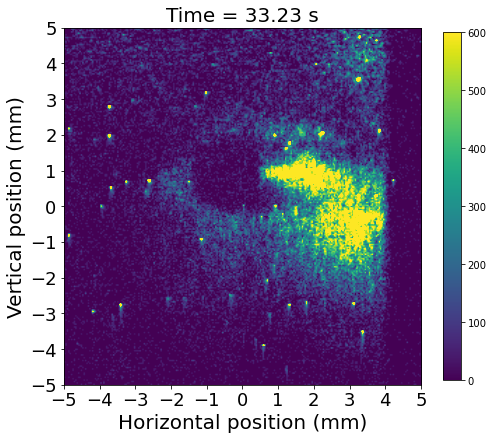

51 53 7.995245 34.977405 0.5


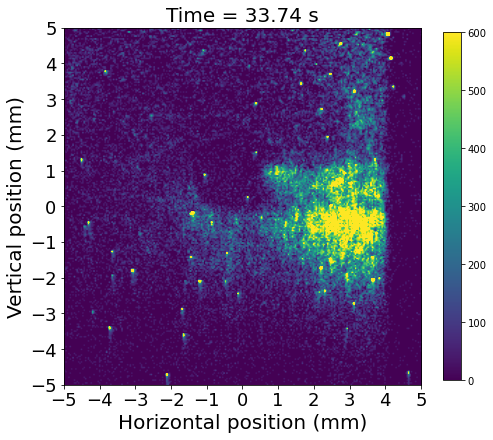

52 53 7.995245 34.977405 0.5


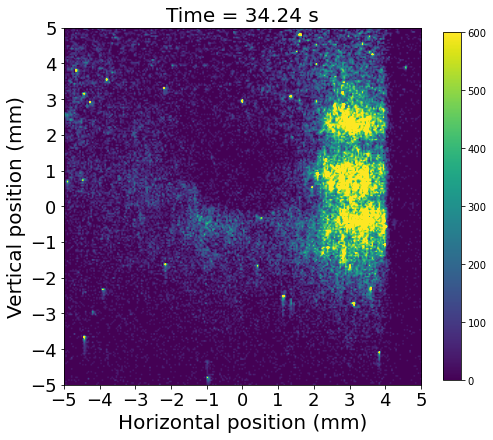

53 53 7.995245 34.977405 0.5


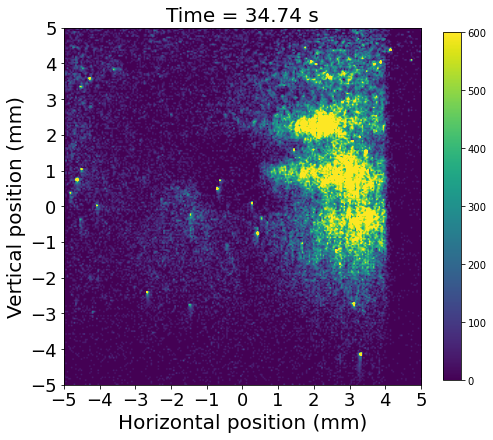

In [23]:
importlib.reload(turbulence)
os.chdir(DefaultDir)
TimeWindow = 0.5 # Each frame is integrated over a 0.5s time window
Vmax = 600 ###### Change Vmax for better viewing contrast
VProjection = turbulence.display_integrated_frames(InputFile, SpeNet, TimeStampArray, TimeWindow, Vmax = 600)

In [24]:
gc.collect() # Release memory

51240

# Clustering Routine
By running this step, a text file containing cluster information will be generated and stored in the main directory named after Filename +'cluster_results.txt'.
Cluster frames along with a movie (Figure. S5) will be created and store under '/cluster_frams' subdirectory. 

## Application of MeanShift code

This section creates an array X that has the locations of all the peaks

X array is used for the clustering algorithms.

Weight is an array of the intensities which is used only with option for k-means

iter_frame is the frame number to perform clustering.  this should vary in range of total_frame_numbers

In [14]:
os.chdir(DefaultDir) 
importlib.reload(turbulence)
quantile = 0.05 ########
n_cluster_min = 20 ######## there must be more than this number of events to qualify as a reported cluster
frame_format = 'jpg'
turbulence.clustering(SpeNet, InputFile, BackFile, nsig, TimeStampArray, cleaner_peaks, n_cluster_min, 'auto', quantile = 0.05, frame_format = 'jpg')

Created Directory :  /Users/xinwen/Desktop/3rd paper/Codes//cluster_frames
XML Footer was not loaded prior to calling _get_wavelength or 
XML Footer does not contain Wavelength Mapping information
Successfully loaded 1 file(s) in a SpeFile object
Frame = 0
Estimated bandwidth: 28.619
Estimated number of clusters: 24
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 

Estimated number of clusters: 22
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 2

Estimated number of clusters: 28
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 2

 Fr#  Cl#    N        x    sig_x        y    256-y    sig_y     SigSum
Frame = 21
Estimated bandwidth: 29.166
Estimated number of clusters: 24
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 2

 Fr#  Cl#    N        x    sig_x        y    256-y    sig_y     SigSum
Frame = 28
Estimated bandwidth: 28.453
Estimated number of clusters: 25
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 2

Frame = 35
Estimated bandwidth: 28.466
Estimated number of clusters: 23
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227

Estimated bandwidth: 29.235
Estimated number of clusters: 24
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 23

 Fr#  Cl#    N        x    sig_x        y    256-y    sig_y     SigSum
Frame = 50
Estimated bandwidth: 30.858
Estimated number of clusters: 24
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 2

Estimated number of clusters: 24
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 2

 Fr#  Cl#    N        x    sig_x        y    256-y    sig_y     SigSum
Frame = 64
Estimated bandwidth: 27.737
Estimated number of clusters: 22
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 2

 Fr#  Cl#    N        x    sig_x        y    256-y    sig_y     SigSum
Frame = 71
Estimated bandwidth: 28.898
Estimated number of clusters: 20
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 2

Estimated number of clusters: 28
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 2

256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 24

256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 24

Estimated number of clusters: 23
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 2

 Fr#  Cl#    N        x    sig_x        y    256-y    sig_y     SigSum
Frame = 106
Estimated bandwidth: 25.731
Estimated number of clusters: 32
256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 

256
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 24

KeyboardInterrupt: 

# Correlator Routine
By running this step, a text file containing correlator results will be generated and stored under 'correlaotr_frames/correlator+Filename' subdirectory.

Plotted correlator frames along with a movie based on your choice of d_limit = X will be generated and stored under 'correlaotr_frames/correlator_frames_dlimX'.

You can run multiple d_limits using a for loop but it will take a very long time if you choose to plot the results at the same time.

In [16]:
os.chdir(DefaultDir) 
importlib.reload(turbulence)

CorrelatorInput = OutputFile+'_cluster_results.txt'
DoPlot = False ###### Choose whether to plot and save each frame. Ture yes False no.
# DoPlot = True

# for TimeMin, TimeMax in ((14,18),(18,30)):
TimeMin = 14 # heater turned on at 14s
TimeMax = 18 # heater turned on at 18s

#     for d_limit in range(1,41):
d_limit = 10
if d_limit == 10 and TimeMax == 18:
    DoPlot = True # Only plot for d_limit = 10
else:
    DoPlot = False
correlator_subfolder1, correlator_subfolder2 = turbulence.correlator(InputFile, 
        CorrelatorInput, TimeStampArray, TimeMin, TimeMax, d_limit, DoPlot, frame_format = 'jpg')

Created Directory :  /Users/xinwen/Desktop/3rd paper/Codes//correlator_frames
Created Directory :  /Users/xinwen/Desktop/3rd paper/Codes//correlator_frames/correlator_Script190_19_42_53_1210
Created Directory :  /Users/xinwen/Desktop/3rd paper/Codes//correlator_frames/correlator_frames_dlim10
334 335 14.01 14.03 4 10
335 336 14.03 14.04 2 7
336 337 14.04 14.06 -1 -1
Did not find pairs within 10 pixels for frames 337 and 338
Did not find pairs within 10 pixels for frames 338 and 339
339 340 14.10 14.12 2 6
Did not find pairs within 10 pixels for frames 340 and 341
341 342 14.13 14.15 1 9
342 343 14.15 14.17 1 -2
343 344 14.17 14.19 -2 0
344 345 14.19 14.21 0 1
345 346 14.21 14.22 0 -6
Did not find pairs within 10 pixels for frames 346 and 347
347 348 14.24 14.26 4 -6
348 349 14.26 14.28 2 -8
349 350 14.28 14.30 -1 -1
Did not find pairs within 10 pixels for frames 350 and 351
Did not find pairs within 10 pixels for frames 351 and 352
352 353 14.33 14.35 -5 -3
Did not find pairs within 10

544 545 17.79 17.81 -2 8
Did not find pairs within 10 pixels for frames 545 and 546
546 547 17.82 17.84 -9 0
547 548 17.84 17.86 -2 6
548 549 17.86 17.88 0 -7
549 550 17.88 17.90 0 -1
Did not find pairs within 10 pixels for frames 550 and 551
Did not find pairs within 10 pixels for frames 551 and 552
Did not find pairs within 10 pixels for frames 552 and 553
553 554 17.95 17.97 1 -5
Did not find pairs within 10 pixels for frames 554 and 555
555 556 17.99 18.00 -6 -3


In [ ]:
# Clear memory
import gc
gc.collect()

## copy correlator results (_subfolder1) to a e-grid folder under main directory after each correlator to combine with others for e-grid step.

# Eulerian grid routine

In [48]:
# os.chdir(correlator_subfolder1)

# # filenames = ['Script113_17_57_06_926','Script113_17_57_59_927','Script113_18_17_36_938','Script113_19_45_16_967']
# filenames = ['Script113_19_45_16_967']
# for d_limit in range(1,41):

#     os.chdir(correlator_subfolder2)
#     ## Creaxat sub-folders for each d_limit
#     frame_subfolder_d = str(DefaultDir)+'correlator_frames/d_limit=%d'%d_limit
#     if not os.path.exists(frame_subfolder_d):
#         os.makedirs(frame_subfolder_d)
#         print("Created Directory : ", frame_subfolder_d)
#     else:
#         print("Directory already existed : ", frame_subfolder_d)

#     os.chdir(frame_subfolder_d)
#     cor_results_Script113_19_45_16_967 = np.loadtxt(str(correlator_subfolder2)+'/CorrelatorResults_%d-%ds_dlim=%d.txt'%(TimeMin, TimeMax, d_limit),skiprows = 0)
# #     cor_results_Script113_19_45_16_967 = np.loadtxt(str(frame_subfolder4)+'/correlator_Script113_19_45_16_967/ResultsFile_12_%d.txt'%d_limit,skiprows = 0)

#     # Combine results of all dataset
# #     cor_results = np.vstack((cor_results_Script113_18_17_36_938,cor_results_Script113_19_45_16_967,cor_results_Script113_17_57_59_927,cor_results_Script113_17_57_06_926))
#     cor_results = cor_results_Script113_19_45_16_967
#     cor_results = cor_results[cor_results[:, 0].argsort()]

#     np.savetxt('Superimpose_d_limit=%d.txt'%d_limit, cor_results, fmt='%d %d %.2f %.2f %.2f %.2f %.2f %.2f %.2f %.2f %.2f %.2f', delimiter='\t') # Save combined matrix into txt file
    
#     XSum = cor_results[:,4]
#     YSum = cor_results[:,5]
#     Frame = cor_results[:,0]
#     print(XSum)
#     print(YSum)
#     plt.figure(figsize = (8,6))
#     plt.plot(Frame, YSum, 'r',label = 'Vertical Direction')
#     plt.plot(Frame, XSum, 'b',label = 'Horizontal Direction')
#     plt.grid('on')
#     plt.xlabel('Frame Number', fontsize = 12)
#     plt.ylabel('Net Velocity', fontsize = 12)
#     plt.legend()
#     plt.title('Net velocity during %d-%ds d_limit=%d'%(TimeMin, TimeMax, d_limit))
#     plt.savefig('Net velocity during %ds and %ds_d_limit=%d.pdf'%(TimeMin, TimeMax, d_limit))

#     plt.figure(figsize = (8,8))
#     plt.xlim((0,255))
#     plt.ylim((0,255))
#     for line in cor_results:
#         plt.arrow(line[6],line[7],line[10],line[11],head_width=2, head_length=3, head_starts_at_zero=False, length_includes_head=True, fc='w')
#     plt.title('Superimpose of all datasets %d-%ds d_limit=%d'%(TimeMin, TimeMax, d_limit))
#     plt.savefig('Superimpose%d%d_d_limit=%d.pdf'%(TimeMin, TimeMax,d_limit))
#     plt.show()


    